In [1]:
import pyspark.sql as pyspark_sql
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
import pyspark.sql.functions as F

In [2]:
import os
import sys

os.environ['PYSPARK_PYTHON'] = sys.executable
os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable

In [3]:
# SparkSession creation
spark = pyspark_sql.SparkSession.builder.appName("Spatio_Temporal_Analysis").getOrCreate()

In [4]:
map = {"Kandy Proper": "kandy_proper.csv",
        "Colombo Proper": "colombo_proper.csv",
        "Deniyaya, Matara": "deniyaya_matara.csv",
        "Nuwara Eliya Proper": "nuwaraeliya_proper.csv",
        "Kurunegala Proper": "kurunegala_proper.csv",
        "Bibile, Monaragala": "bibile_monaragala.csv",
        "Jaffna Proper": "jaffna_proper.csv"}

In [5]:
def get_dataframe(location):
    global map
    
    df = spark.read.csv(r"../data/processed/" + map[location], header=True, inferSchema=True)\
        .select("current_date", "hcho_reading").toPandas()
    
    # Convert the current_date column to datetime
    df["current_date"] = pd.to_datetime(df["current_date"])

    # Set date as the index
    df.set_index("current_date", inplace=True, drop=True)

    return df

In [6]:
def plot_seasonal_decompose(location):
    df = get_dataframe(location)

    # Decompose the time series
    decomposition = seasonal_decompose(df["hcho_reading"], model='additive', period=365)

    # Plot the decomposition
    fig, axes = plt.subplots(4, 1, figsize=(12, 16))
    fig.suptitle(f"Seasonal Decomposition of HCHO Levels in {location}", fontsize=16, y=0.95)

    # Plot the original data with lockdown periods
    decomposition.observed.plot(ax=axes[0])
    axes[0].set_ylabel('Original')
    # show lockdown period
    axes[0].axvline(x=pd.to_datetime('2020-03-01'), color='r', linestyle='--')
    axes[0].axvline(x=pd.to_datetime('2020-05-28'), color='r', linestyle='--')
    axes[0].axvline(x=pd.to_datetime('2021-08-01'), color='g', linestyle='--')
    axes[0].axvline(x=pd.to_datetime('2021-10-31'), color='g', linestyle='--')

    # Plot the trend component with lockdown periods
    decomposition.trend.plot(ax=axes[1])
    axes[1].set_ylabel('Trend')
    # show lockdown period
    axes[1].axvline(x=pd.to_datetime('2020-03-01'), color='r', linestyle='--')
    axes[1].axvline(x=pd.to_datetime('2020-05-28'), color='r', linestyle='--')
    axes[1].axvline(x=pd.to_datetime('2021-08-01'), color='g', linestyle='--')
    axes[1].axvline(x=pd.to_datetime('2021-10-31'), color='g', linestyle='--')
    
    lockdown1 = plt.Line2D([], [], color='r', linestyle='--', label='lockdown 1')
    lockdown2 = plt.Line2D([], [], color='g', linestyle='--', label='lockdown 2')
    axes[1].legend(handles=[lockdown1, lockdown2])
    axes[0].legend(handles=[lockdown1, lockdown2], loc='upper right')

    # Plot the seasonal component
    decomposition.seasonal.plot(ax=axes[2])
    axes[2].set_ylabel('Seasonal')

    # Plot the residual component
    decomposition.resid.plot(ax=axes[3])
    axes[3].set_ylabel('Residual')

    # Adjust the layout
    plt.subplots_adjust(top=0.925, hspace=0.20)
    plt.show()

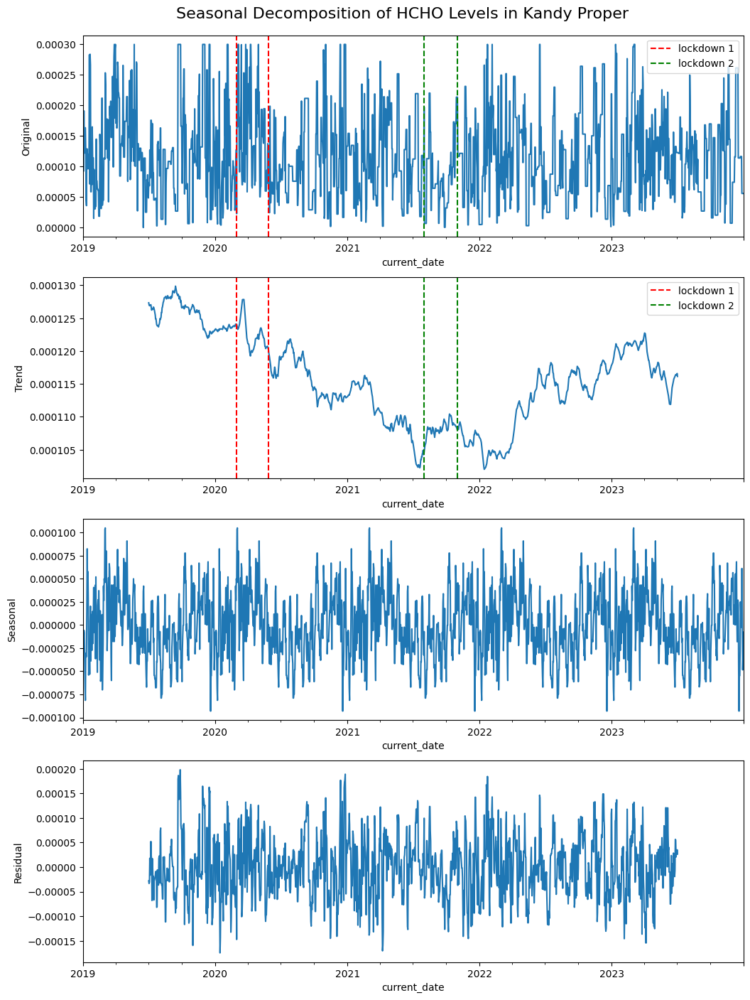

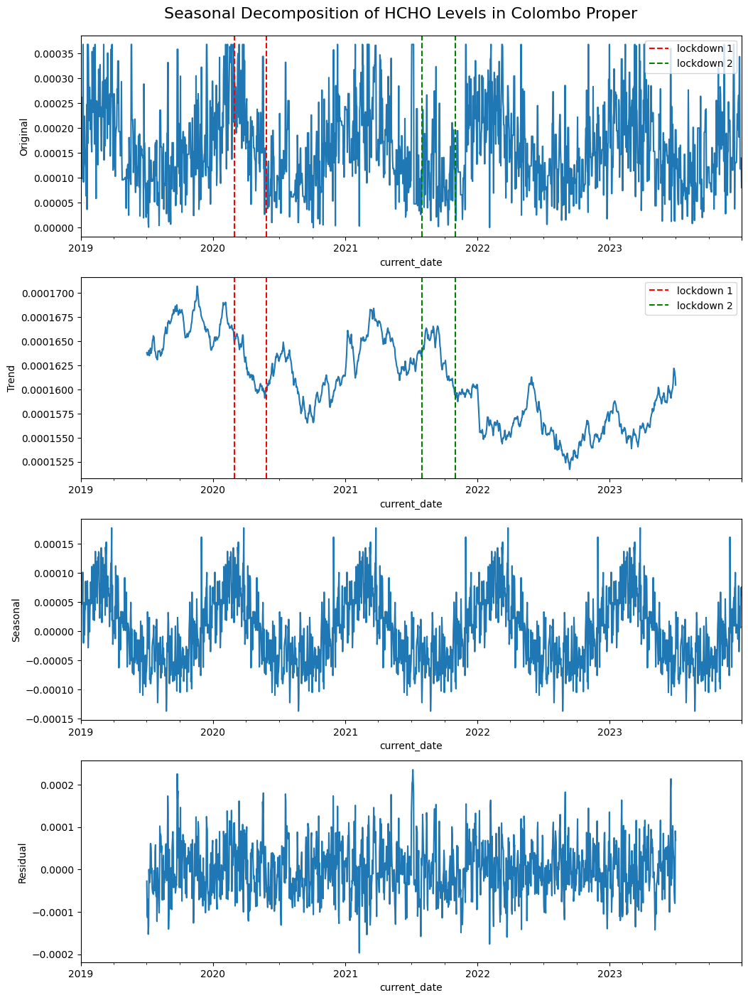

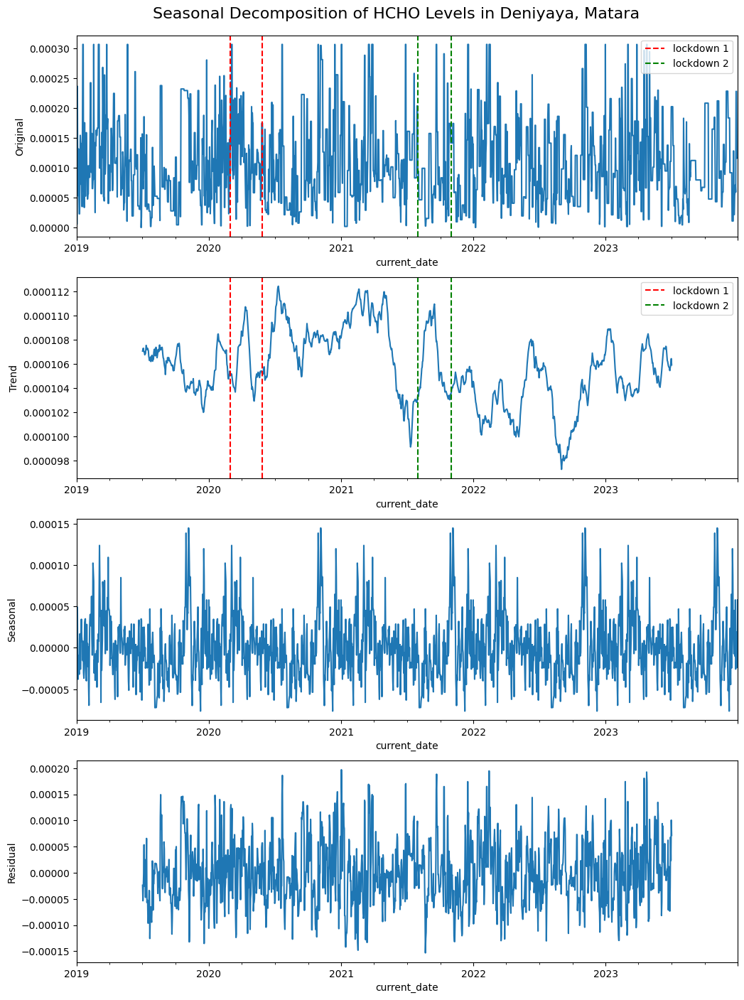

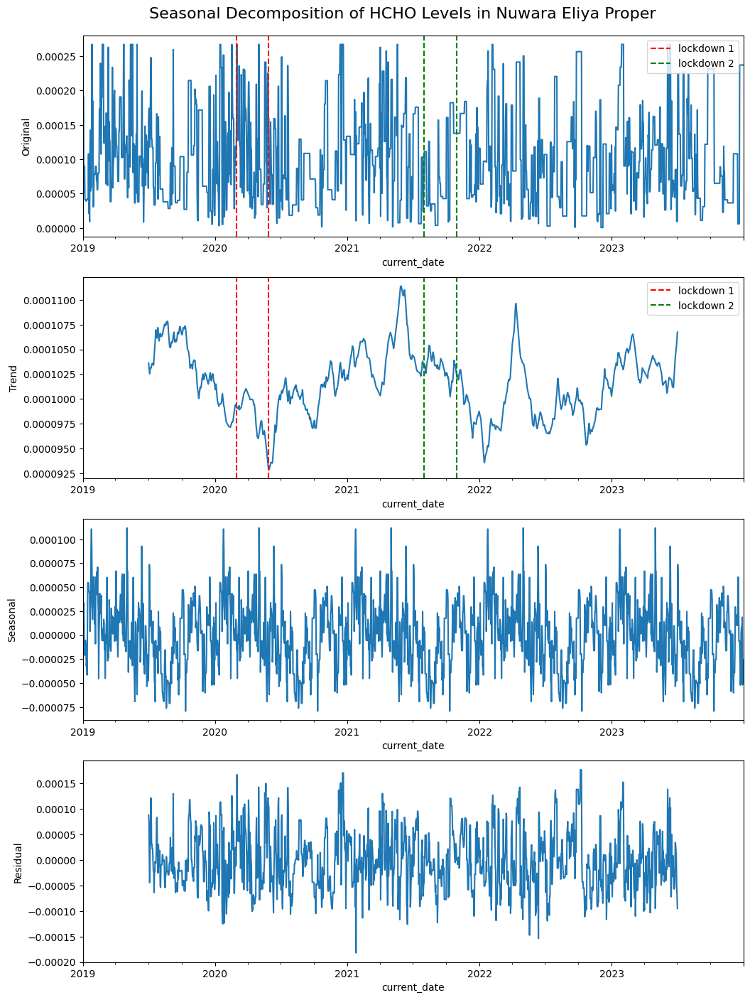

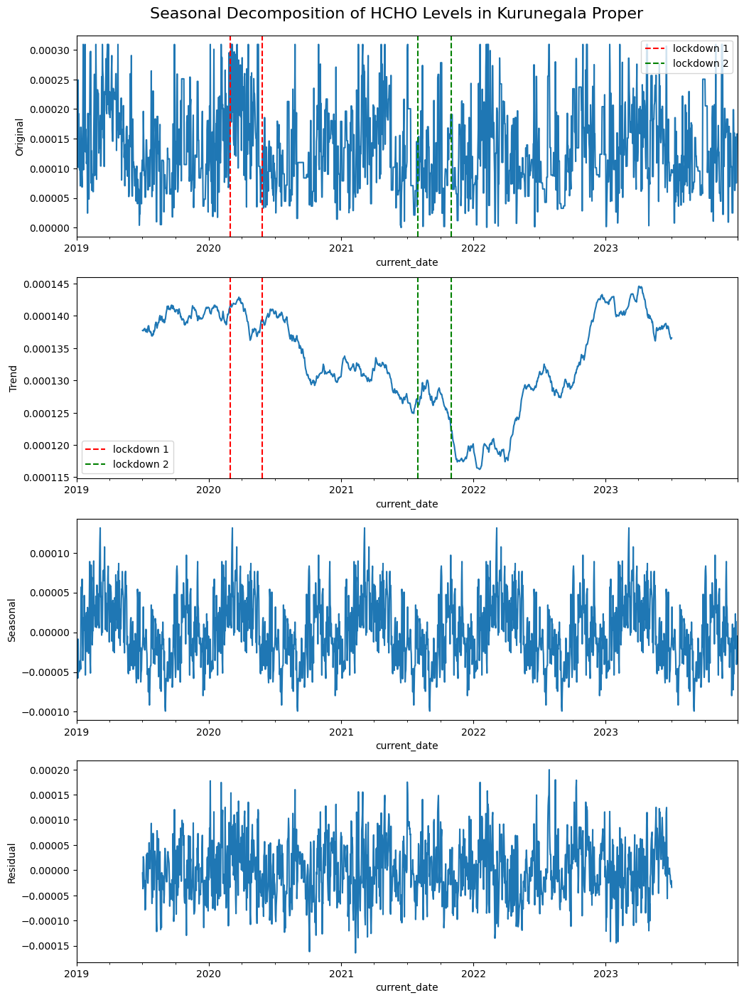

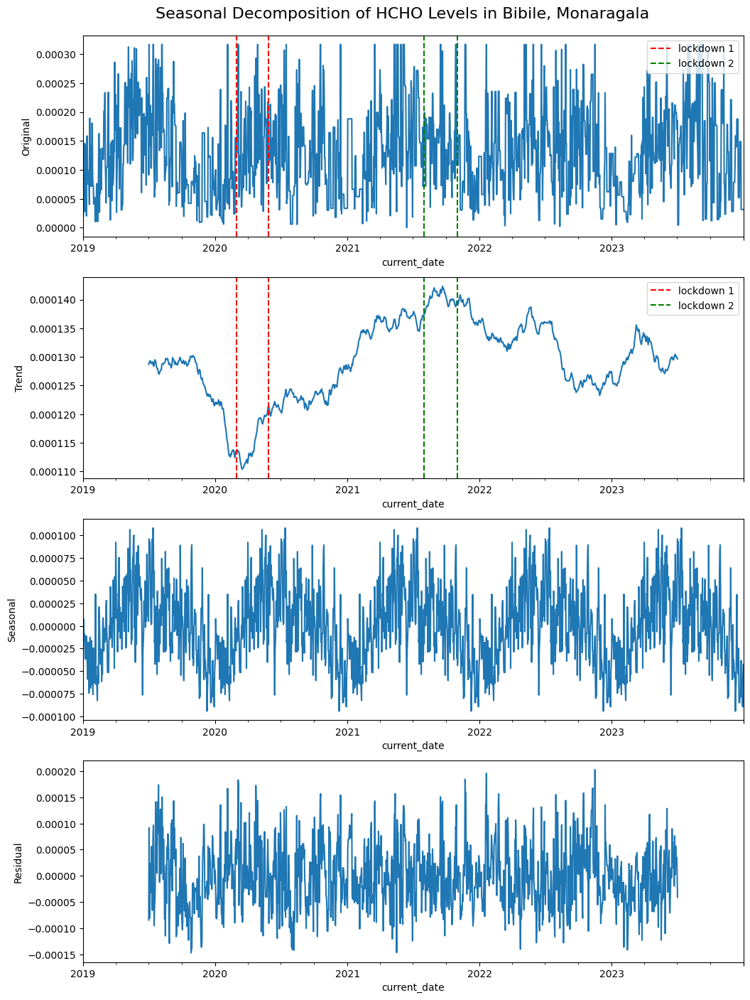

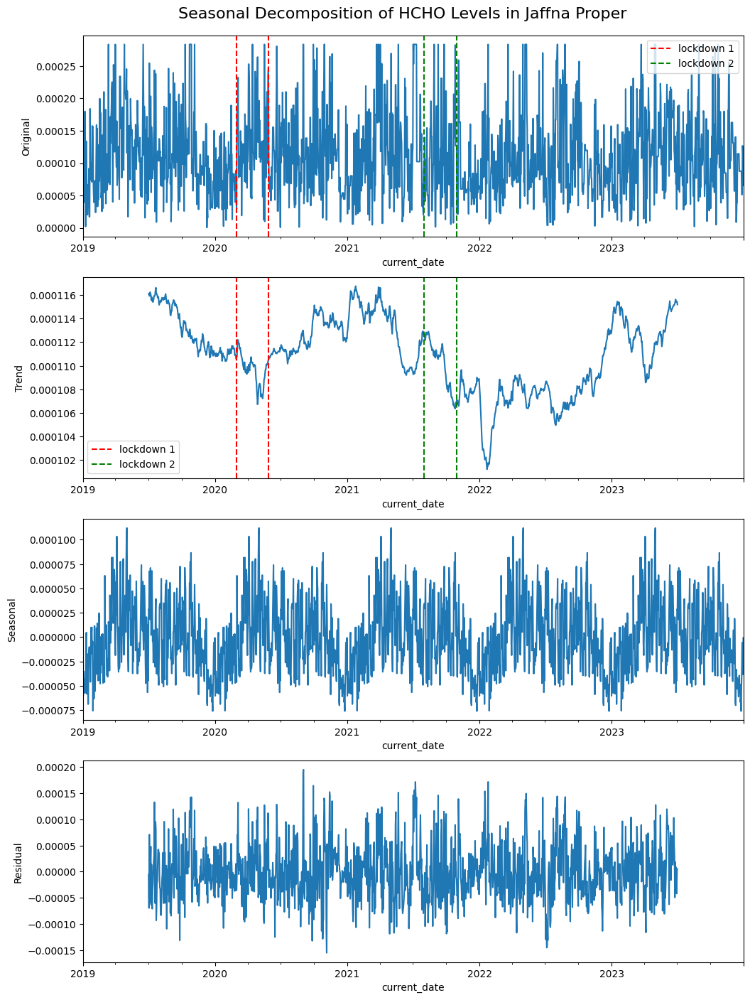

In [7]:
locations = map.keys()

for location in locations:
    plot_seasonal_decompose(location)

### Dataset with External Factors

In [4]:
data = spark.read.csv(r"../data/external_factors.csv", header=True, inferSchema=True)

In [5]:
data.show(truncate=False)

+------------+---------------------+--------+--------+---------+-----------------------+-----------------+-------------------+-------------+-------------+------------------+---------+--------------+
|current_date|hcho_reading         |temp_max|temp_min|temp_mean|shortwave_radiation_sum|precipitation_sum|precipitation_hours|windspeed_max|windgusts_max|evapotranspiration|elevation|location      |
+------------+---------------------+--------+--------+---------+-----------------------+-----------------+-------------------+-------------+-------------+------------------+---------+--------------+
|2019-01-01  |1.9698343957810148E-4|30.0    |23.1    |26.1     |19.77                  |0.0              |0.0                |14.4         |29.9         |4.58              |16.0     |Colombo Proper|
|2019-01-02  |2.6255221719685945E-4|29.4    |22.7    |25.7     |21.45                  |0.0              |0.0                |16.6         |31.0         |5.19              |16.0     |Colombo Proper|
|2019

In [6]:
data.printSchema()

root
 |-- current_date: date (nullable = true)
 |-- hcho_reading: double (nullable = true)
 |-- temp_max: double (nullable = true)
 |-- temp_min: double (nullable = true)
 |-- temp_mean: double (nullable = true)
 |-- shortwave_radiation_sum: double (nullable = true)
 |-- precipitation_sum: double (nullable = true)
 |-- precipitation_hours: double (nullable = true)
 |-- windspeed_max: double (nullable = true)
 |-- windgusts_max: double (nullable = true)
 |-- evapotranspiration: double (nullable = true)
 |-- elevation: double (nullable = true)
 |-- location: string (nullable = true)



In [7]:
# Get distinct location in data
locations = data.select("location").distinct().rdd.flatMap(lambda x: x).collect()

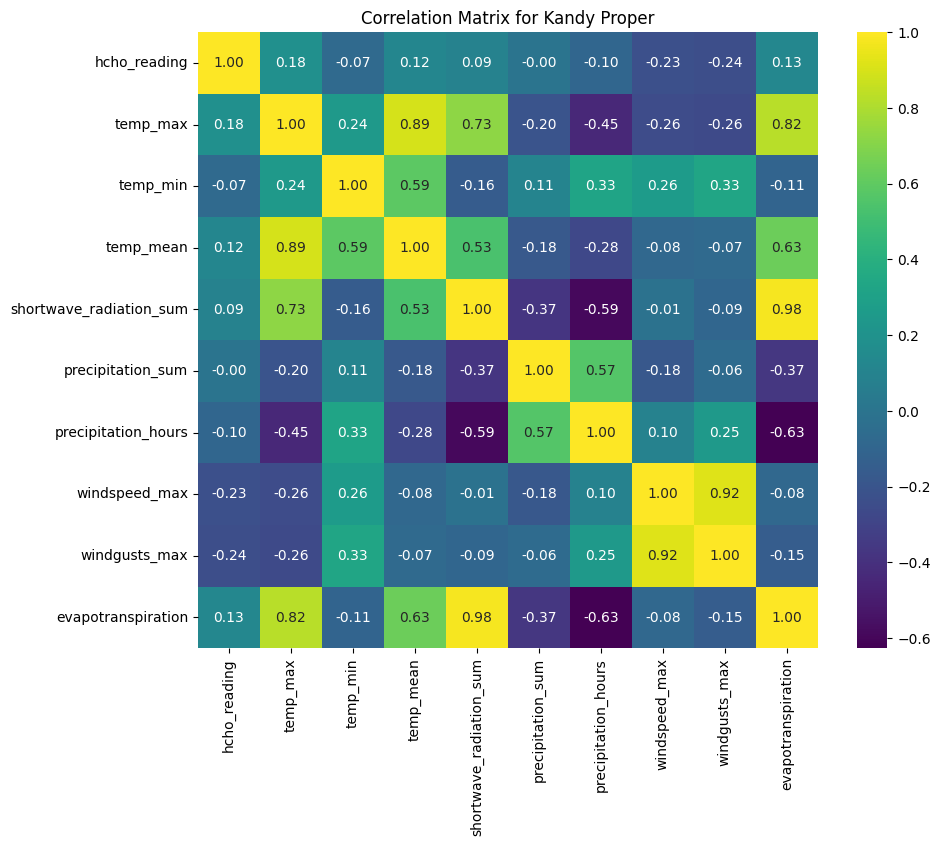

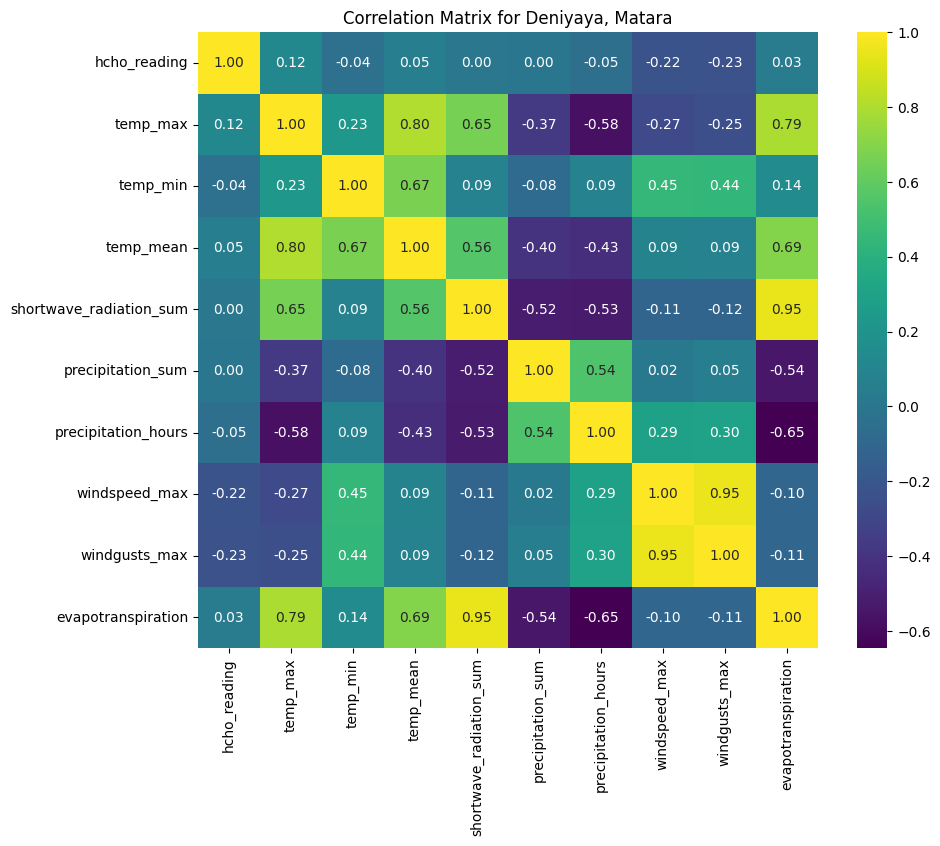

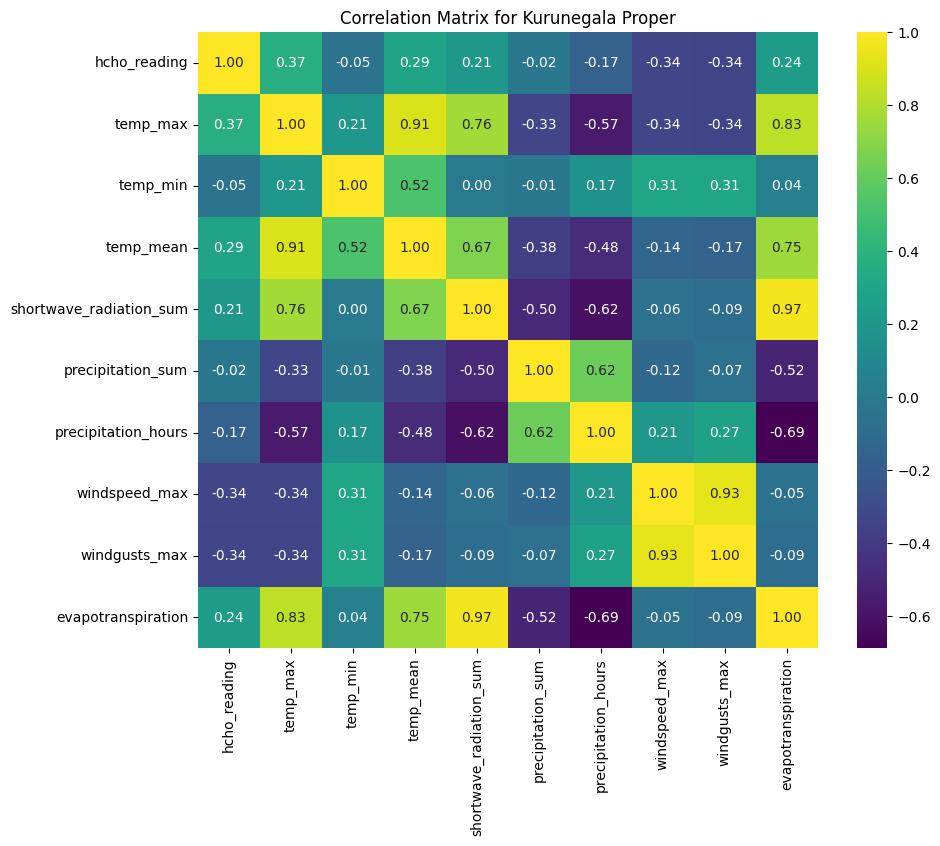

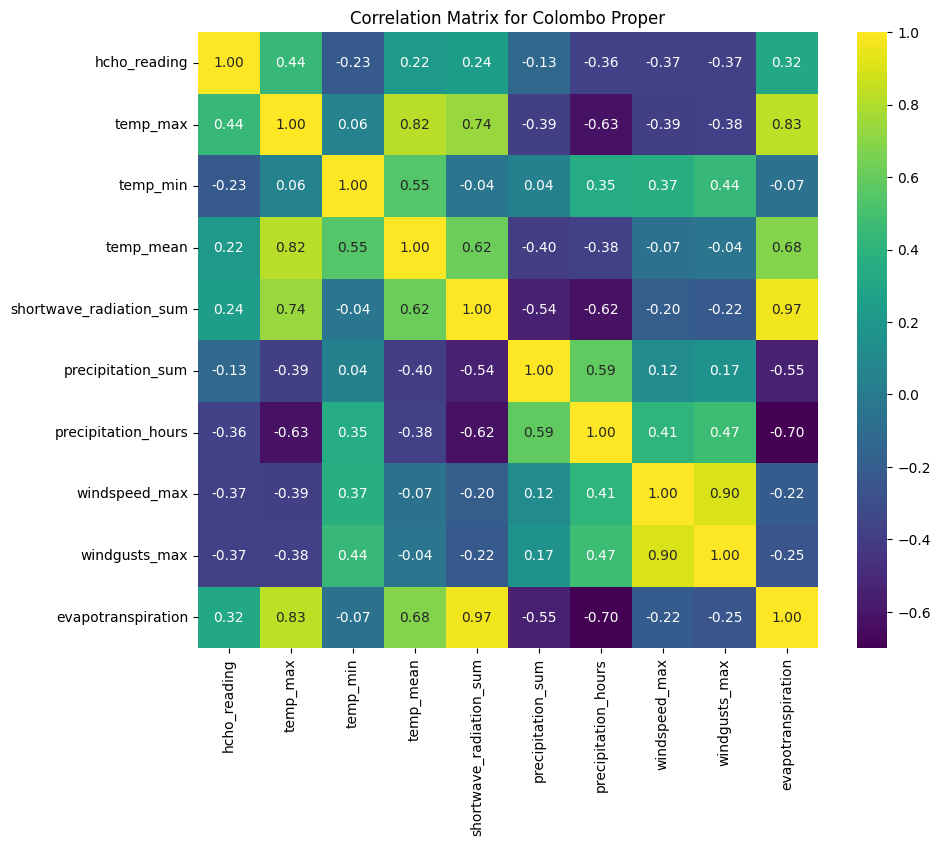

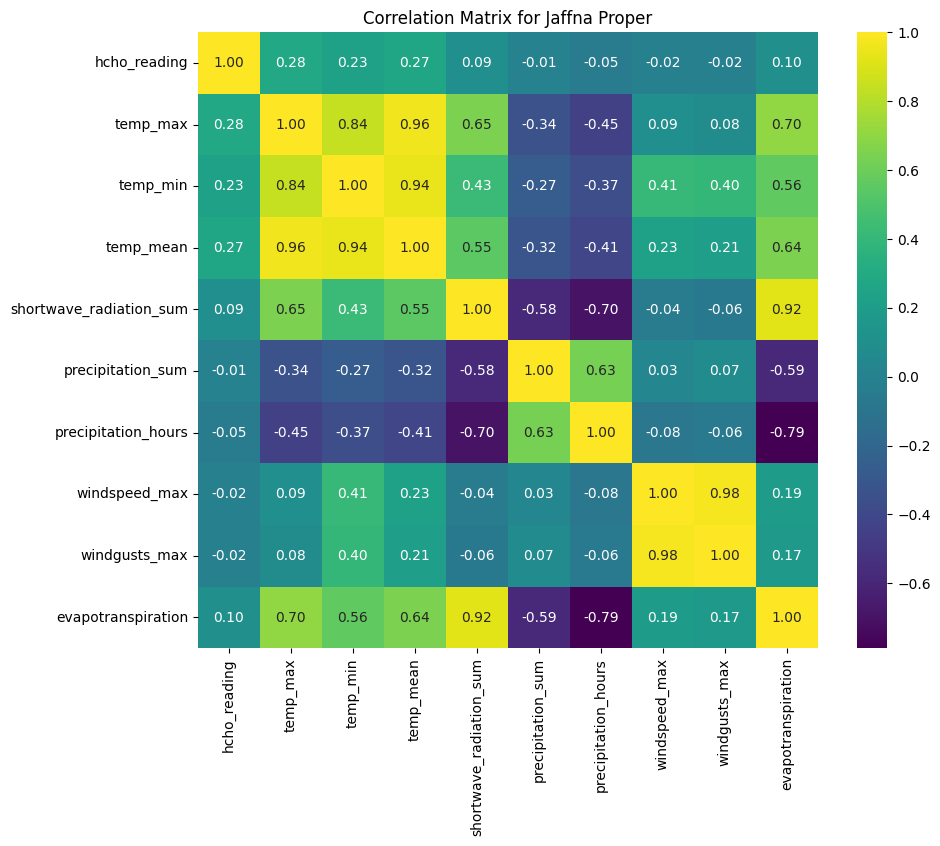

In [8]:
# plot correlation matrix as a heatmap for each location
for city in locations:
    city_data = data.filter(data.location == city).toPandas()

    # select only numerical columns
    city_data = city_data.select_dtypes(include='number')

    # remove elevation column since it is constant
    city_data.drop("elevation", axis=1, inplace=True)

    # plot correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(city_data.corr(), annot=True, cmap='viridis', fmt=".2f")
    plt.title(f"Correlation Matrix for {city}")
    plt.show()


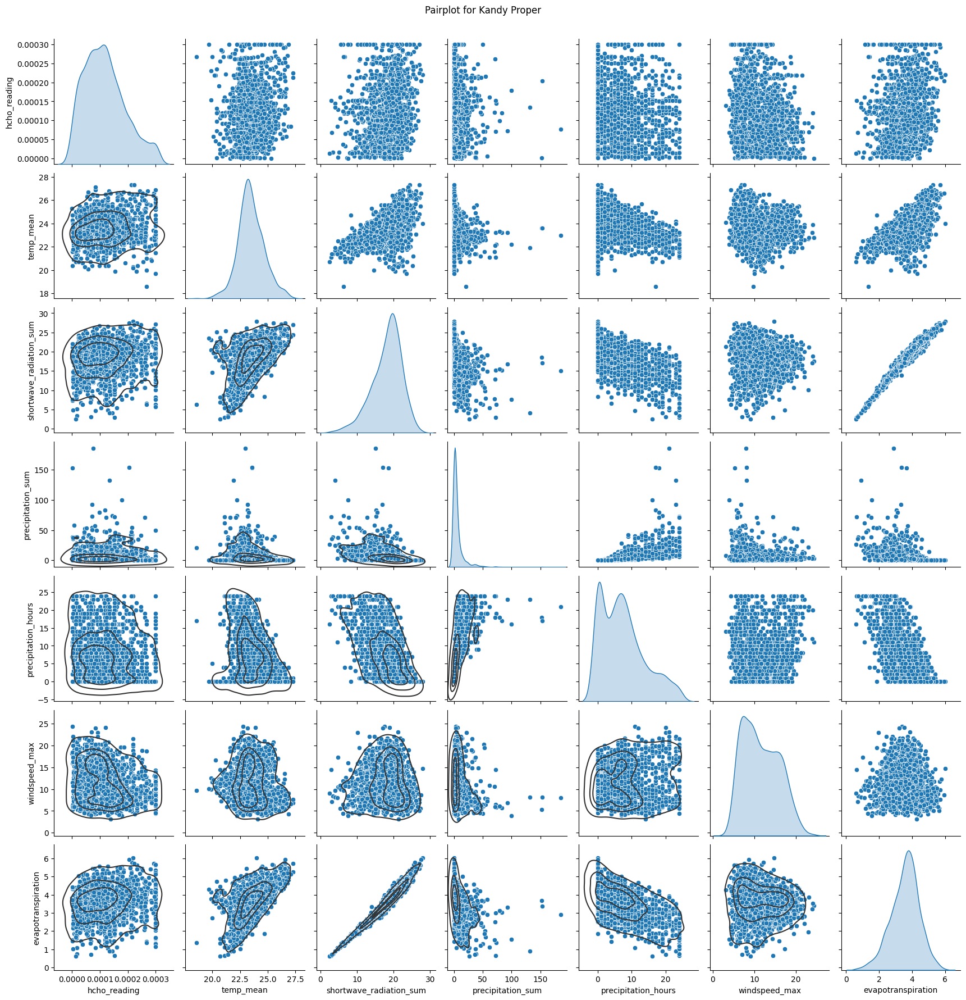

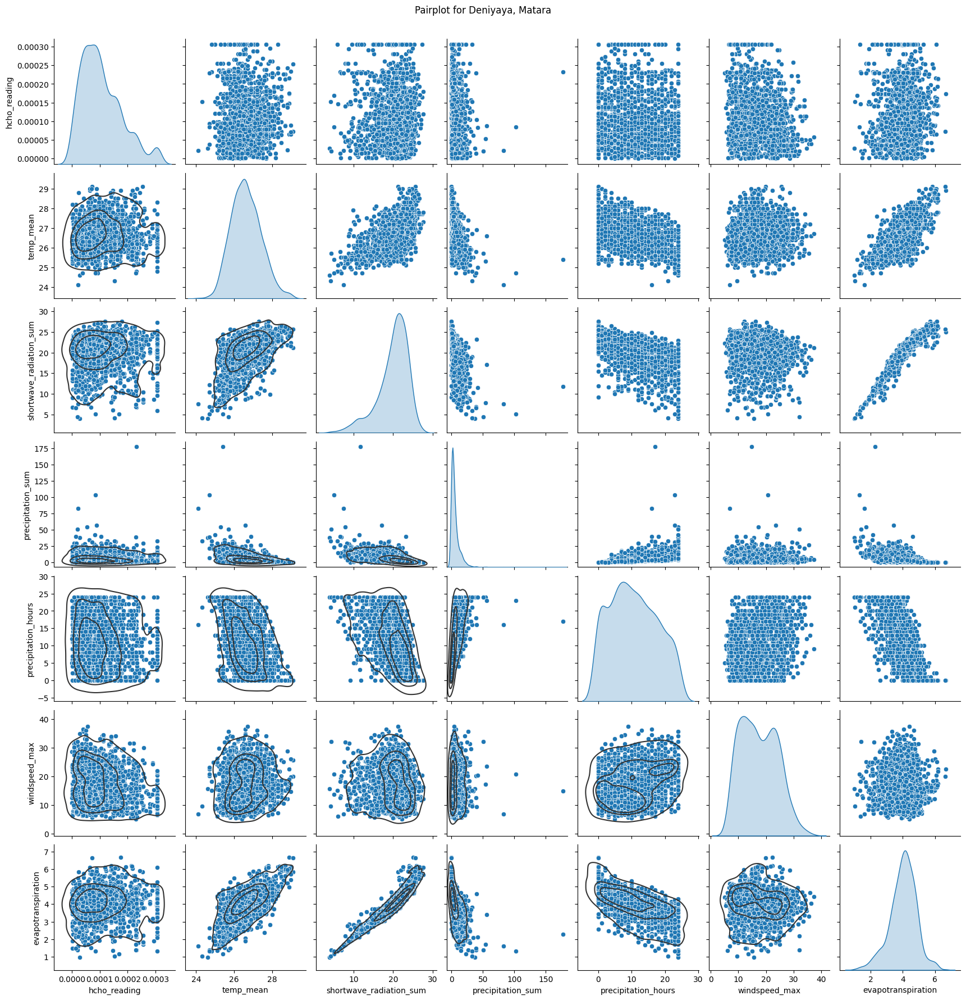

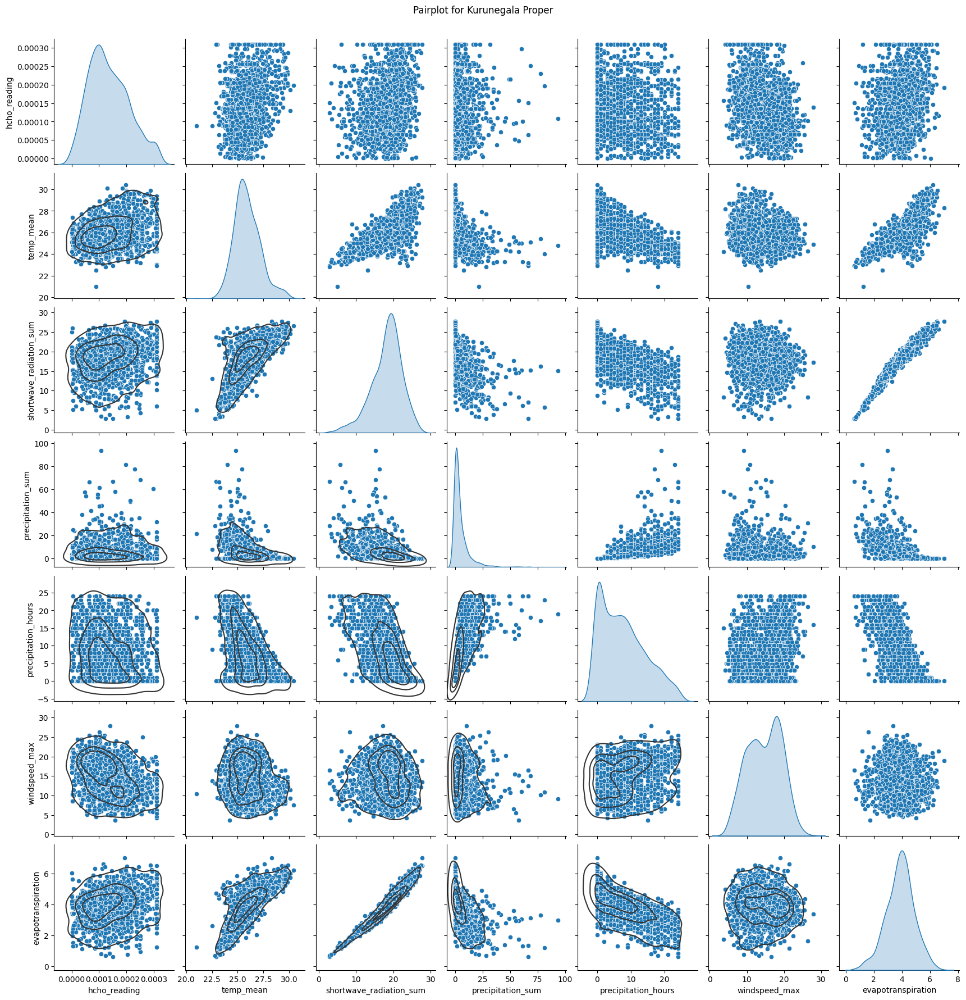

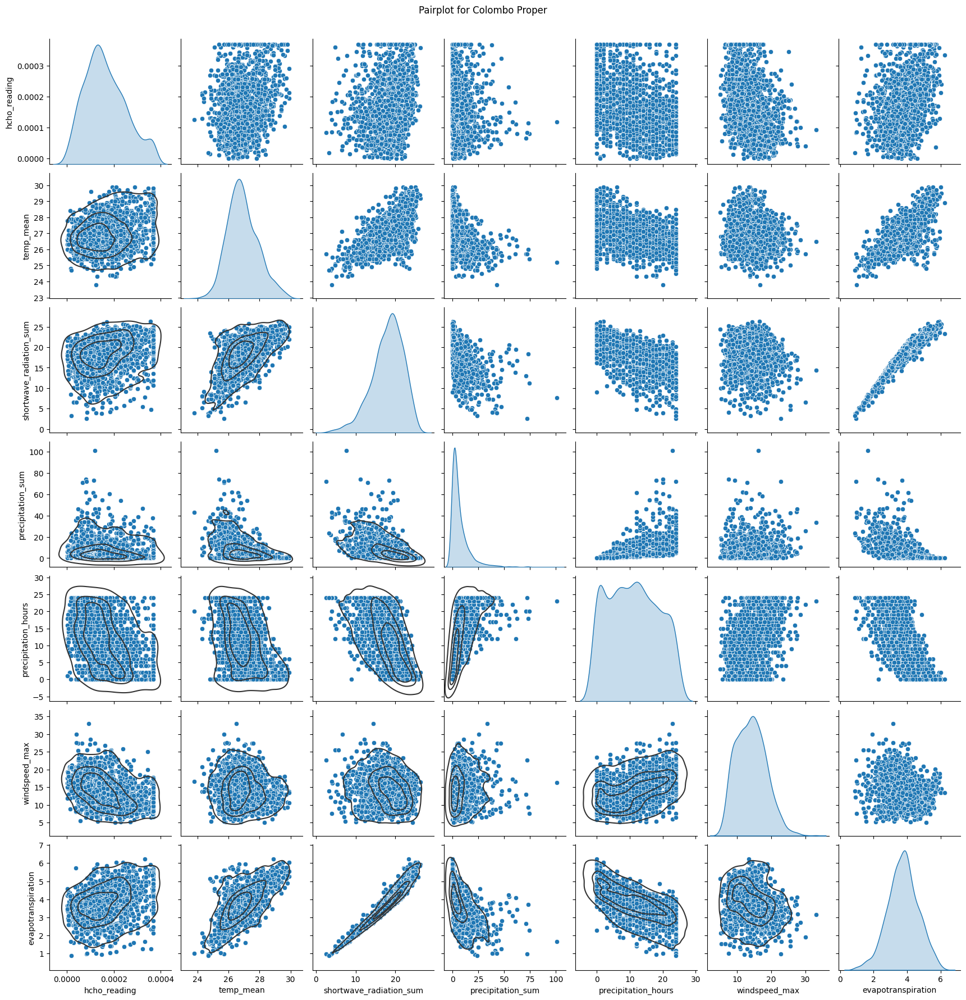

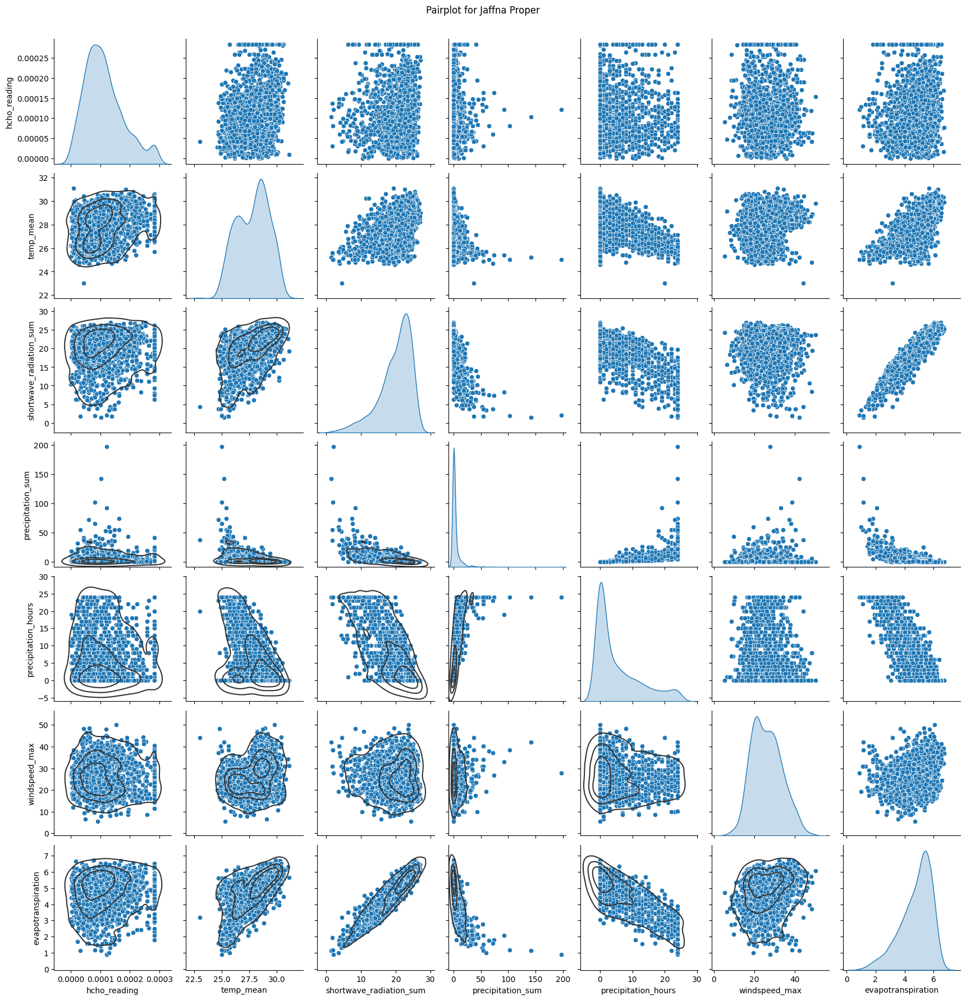

In [9]:
# Draw pairplots for each location
for city in locations:
    city_data = data.filter(data.location == city).toPandas()

    # select only numerical columns
    city_data = city_data.select_dtypes(include='number')

    # remove elevation, temp_min, temp_max, windgust_max columns
    city_data.drop(["elevation", "temp_min", "temp_max", "windgusts_max"], axis=1, inplace=True)

    # plot pairplot
    g = sns.pairplot(city_data, diag_kind='kde')
    g.map_lower(sns.kdeplot, levels=4, color=".2")
    plt.suptitle(f"Pairplot for {city}", y=1.02)
    plt.show()

# Compare Spatial Patterns

Resources :

1. Population dataset :http://www.statistics.gov.lk/Resource/en/Population/Vital_Statistics/Mid-year_population_by_district.pdf
2. Area Dataset :http://www.statistics.gov.lk/abstract2019/CHAP1/1.1

In [14]:
population = spark.read.csv(r"../data/Population.csv", header=True, inferSchema=True)

In [15]:
population.show(truncate=False)

+------------+--------+----+
|District    |Total   |Year|
+------------+--------+----+
|Sri Lanka   |21803000|2019|
|Colombo     |2448000 |2019|
|Gampaha     |2417000 |2019|
|Kalutara    |1284000 |2019|
|Kandy       |1476000 |2019|
|Matale      |522000  |2019|
|Nuwara Eliya|768000  |2019|
|Galle       |1130000 |2019|
|Matara      |863000  |2019|
|Hambantota  |661000  |2019|
|Jaffna      |617000  |2019|
|Kilinochchi |129000  |2019|
|Mannar      |111000  |2019|
|Vavuniya    |189000  |2019|
|Mullaitivu  |97000   |2019|
|Batticaloa  |575000  |2019|
|Ampara      |728000  |2019|
|Trincomalee |426000  |2019|
|Kurunegala  |1719000 |2019|
|Puttalam    |832000  |2019|
+------------+--------+----+
only showing top 20 rows



In [16]:
population.printSchema()

root
 |-- District: string (nullable = true)
 |-- Total: integer (nullable = true)
 |-- Year: integer (nullable = true)



In [17]:
# Get only Colombo, Kandy, Nuwara Eliya, Jaffna, Nuwara Eliya, Kurunegala, Matara, Monaragala
locations = ["Colombo", "Kandy", "Nuwara Eliya", "Jaffna", "Kurunegala", "Matara", "Monaragala"]

# filter only the locations in the list
population = population.filter(population.District.isin(locations))

In [18]:
population.show(truncate=False) 

+------------+-------+----+
|District    |Total  |Year|
+------------+-------+----+
|Colombo     |2448000|2019|
|Kandy       |1476000|2019|
|Nuwara Eliya|768000 |2019|
|Matara      |863000 |2019|
|Jaffna      |617000 |2019|
|Kurunegala  |1719000|2019|
|Monaragala  |496000 |2019|
|Colombo     |2455000|2020|
|Kandy       |1483000|2020|
|Nuwara Eliya|773000 |2020|
|Matara      |866000 |2020|
|Jaffna      |621000 |2020|
|Kurunegala  |1726000|2020|
|Monaragala  |501000 |2020|
|Colombo     |2480000|2021|
|Kandy       |1501000|2021|
|Nuwara Eliya|780000 |2021|
|Matara      |873000 |2021|
|Jaffna      |626000 |2021|
|Kurunegala  |1743000|2021|
+------------+-------+----+
only showing top 20 rows



In [19]:
population.select("District").distinct().show()

+------------+
|    District|
+------------+
|      Matara|
|     Colombo|
|      Jaffna|
|Nuwara Eliya|
|  Monaragala|
|       Kandy|
|  Kurunegala|
+------------+



In [20]:
area = spark.read.csv(r"../data/Area.csv", header=True, inferSchema=True)

In [21]:
area.show(truncate=False)

+-----------------+-----+-----+-------------+
|District         |Total|Land |Inland waters|
+-----------------+-----+-----+-------------+
|Sri Lanka        |65610|62705|2,905        |
|Western Province |3684 |3593 |91           |
|Colombo          |699  |676  |23           |
|Gampaha          |1,387|1341 |46           |
|Kalutara         |1,598|1576 |22           |
|Central Province |5,674|5575 |99           |
|Kandy            |1,940|1917 |23           |
|Matale           |1,993|1952 |41           |
|Nuwara Eliya     |1,741|1706 |35           |
|Southern Province|5,544|5383 |161          |
|Galle            |1,652|1617 |35           |
|Matara           |1,283|1270 |13           |
|Hambantota       |2,609|2496 |113          |
|Northern Province|8884 |8290 |594          |
|Jaffna           |1,025|929  |96           |
|Mannar           |1,996|1880 |116          |
|Vavuniya         |1,891|1787 |104          |
|Mullaitivu       |2,693|2489 |204          |
|Kilinochchi      |1,279|1205 |74 

In [22]:
area.printSchema()

root
 |-- District: string (nullable = true)
 |-- Total: string (nullable = true)
 |-- Land: integer (nullable = true)
 |-- Inland waters: string (nullable = true)



In [23]:
area = area.select("District", "Land").filter(area.District.isin(locations))

In [24]:
area.show(truncate = True)

+------------+----+
|    District|Land|
+------------+----+
|     Colombo| 676|
|       Kandy|1917|
|Nuwara Eliya|1706|
|      Matara|1270|
|      Jaffna| 929|
|  Kurunegala|4624|
|  Monaragala|5508|
+------------+----+



In [25]:
# Join the population and area dataframes
population_area = population.join(area, on="District", how="inner")

In [26]:
# Rename columns
population_area = population_area.withColumnRenamed("Land", "area")\
    .withColumnRenamed("Total", "population")\
    .withColumnRenamed("District", "location")\
    .withColumnRenamed("Year", "year")


In [27]:
population_area.printSchema()

root
 |-- location: string (nullable = true)
 |-- population: integer (nullable = true)
 |-- year: integer (nullable = true)
 |-- area: integer (nullable = true)



In [28]:
population_area.show(truncate=False)

+------------+----------+----+----+
|location    |population|year|area|
+------------+----------+----+----+
|Colombo     |2448000   |2019|676 |
|Kandy       |1476000   |2019|1917|
|Nuwara Eliya|768000    |2019|1706|
|Matara      |863000    |2019|1270|
|Jaffna      |617000    |2019|929 |
|Kurunegala  |1719000   |2019|4624|
|Monaragala  |496000    |2019|5508|
|Colombo     |2455000   |2020|676 |
|Kandy       |1483000   |2020|1917|
|Nuwara Eliya|773000    |2020|1706|
|Matara      |866000    |2020|1270|
|Jaffna      |621000    |2020|929 |
|Kurunegala  |1726000   |2020|4624|
|Monaragala  |501000    |2020|5508|
|Colombo     |2480000   |2021|676 |
|Kandy       |1501000   |2021|1917|
|Nuwara Eliya|780000    |2021|1706|
|Matara      |873000    |2021|1270|
|Jaffna      |626000    |2021|929 |
|Kurunegala  |1743000   |2021|4624|
+------------+----------+----+----+
only showing top 20 rows



In [29]:
# Calculate popularity density and add it to the population_area dataframe
population_area = population_area.withColumn("population_density", F.round(population_area.population / population_area.area, 2))

In [30]:
population_area.show(truncate=False)

+------------+----------+----+----+------------------+
|location    |population|year|area|population_density|
+------------+----------+----+----+------------------+
|Colombo     |2448000   |2019|676 |3621.3            |
|Kandy       |1476000   |2019|1917|769.95            |
|Nuwara Eliya|768000    |2019|1706|450.18            |
|Matara      |863000    |2019|1270|679.53            |
|Jaffna      |617000    |2019|929 |664.16            |
|Kurunegala  |1719000   |2019|4624|371.76            |
|Monaragala  |496000    |2019|5508|90.05             |
|Colombo     |2455000   |2020|676 |3631.66           |
|Kandy       |1483000   |2020|1917|773.6             |
|Nuwara Eliya|773000    |2020|1706|453.11            |
|Matara      |866000    |2020|1270|681.89            |
|Jaffna      |621000    |2020|929 |668.46            |
|Kurunegala  |1726000   |2020|4624|373.27            |
|Monaragala  |501000    |2020|5508|90.96             |
|Colombo     |2480000   |2021|676 |3668.64           |
|Kandy    

In [31]:
population_area.count()

35

In [33]:
hcho_data = spark.read.csv(r"../data/processed/all_data.csv", header=True, inferSchema=True)

In [34]:
# group by location and calculate the average hcho_reading for each year (2019, 2020, 2021, 2022, 2023)
hcho_data = hcho_data.groupBy("location", F.year("current_date").alias("year"))\
    .agg(F.avg("hcho_reading").alias("avg_hcho_reading"))

In [35]:
hcho_data.show(truncate=False)

+-------------------+----+---------------------+
|location           |year|avg_hcho_reading     |
+-------------------+----+---------------------+
|Colombo Proper     |2023|1.604477218097932E-4 |
|Colombo Proper     |2019|1.6380077253373357E-4|
|Colombo Proper     |2021|1.626862258493313E-4 |
|Jaffna Proper      |2019|1.1610412757034215E-4|
|Bibile, Monaragala |2023|1.2961887560433136E-4|
|Bibile, Monaragala |2022|1.3594640403424274E-4|
|Kandy Proper       |2021|1.0575242448038023E-4|
|Colombo Proper     |2022|1.5652069472875345E-4|
|Kandy Proper       |2023|1.161419116449505E-4 |
|Kurunegala Proper  |2023|1.3657134270248712E-4|
|Deniyaya, Matara   |2020|1.0941298540665068E-4|
|Deniyaya, Matara   |2022|1.053212572936876E-4 |
|Nuwara Eliya Proper|2023|1.0672827641765904E-4|
|Kandy Proper       |2022|1.1485841677889332E-4|
|Kurunegala Proper  |2019|1.3772382854179748E-4|
|Bibile, Monaragala |2019|1.2870042361094166E-4|
|Kurunegala Proper  |2020|1.40427579931242E-4  |
|Kandy Proper       

In [36]:
hcho_data.count()

35

In [37]:
# Change location names of population_area dataframe to match the hcho_data dataframe
population_area = population_area.withColumn("location", F.when(population_area.location == "Colombo", "Colombo Proper")\
    .when(population_area.location == "Kandy", "Kandy Proper")\
    .when(population_area.location == "Nuwara Eliya", "Nuwara Eliya Proper")\
    .when(population_area.location == "Jaffna", "Jaffna Proper")\
    .when(population_area.location == "Kurunegala", "Kurunegala Proper")\
    .when(population_area.location == "Matara", "Deniyaya, Matara")\
    .when(population_area.location == "Monaragala", "Bibile, Monaragala"))

In [40]:
population_area.toPandas().to_csv(r"../data/population_density.csv", index=False)

In [38]:
# Join the hcho_data and population_area dataframes on location and year
hcho_population_area = hcho_data.join(population_area, on=["location", "year"], how="inner")

In [39]:
hcho_population_area.show(truncate=False)

+-------------------+----+---------------------+----------+----+------------------+
|location           |year|avg_hcho_reading     |population|area|population_density|
+-------------------+----+---------------------+----------+----+------------------+
|Colombo Proper     |2019|1.6380077253373357E-4|2448000   |676 |3621.3            |
|Kandy Proper       |2019|1.2734102329874902E-4|1476000   |1917|769.95            |
|Nuwara Eliya Proper|2019|1.0362410011906432E-4|768000    |1706|450.18            |
|Deniyaya, Matara   |2019|1.0707201984643345E-4|863000    |1270|679.53            |
|Jaffna Proper      |2019|1.1610412757034215E-4|617000    |929 |664.16            |
|Kurunegala Proper  |2019|1.3772382854179748E-4|1719000   |4624|371.76            |
|Bibile, Monaragala |2019|1.2870042361094166E-4|496000    |5508|90.05             |
|Colombo Proper     |2020|1.631286070661978E-4 |2455000   |676 |3631.66           |
|Kandy Proper       |2020|1.1870998135386272E-4|1483000   |1917|773.6       

In [41]:
hcho_population_area = hcho_population_area.drop("area", "population")

In [44]:
locations = hcho_population_area.select("location").distinct().rdd.flatMap(lambda x: x).collect()

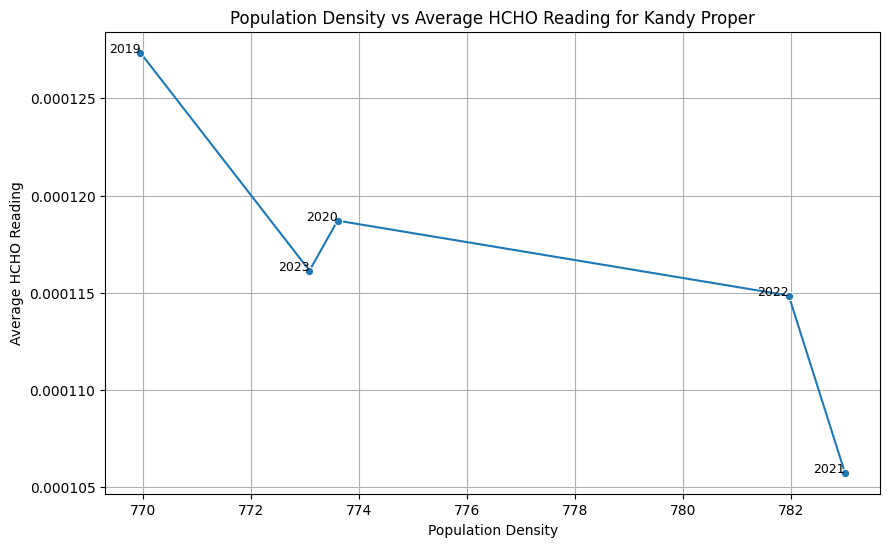

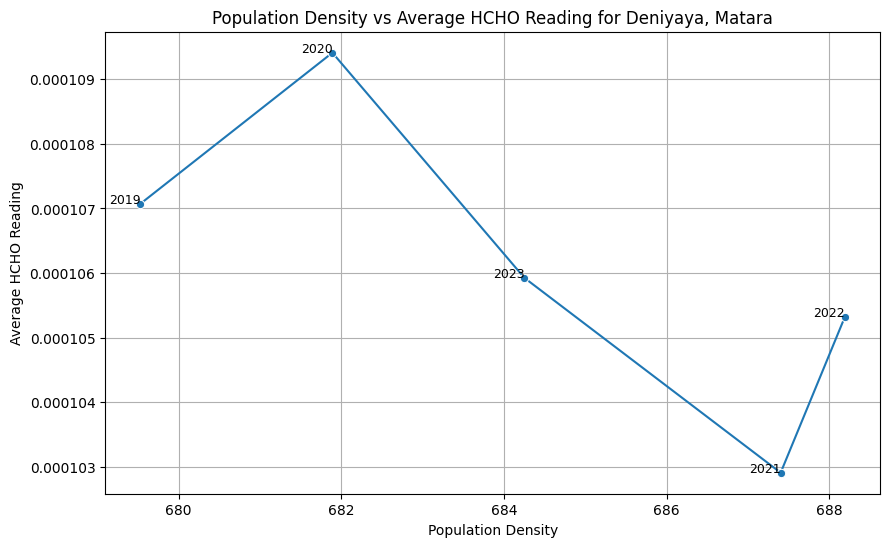

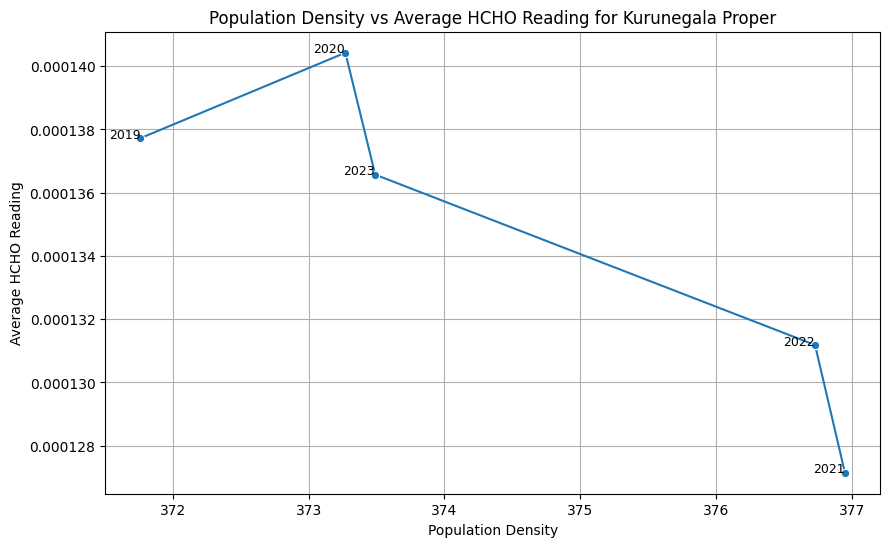

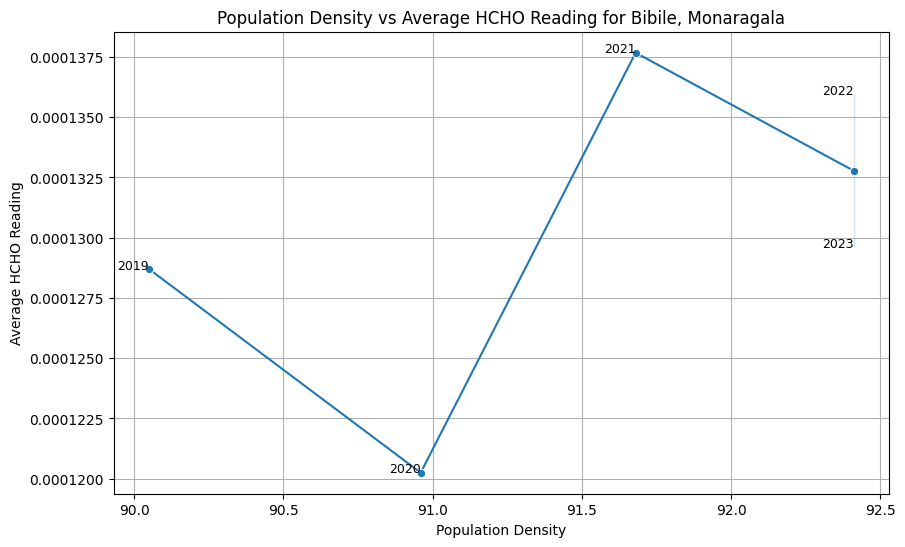

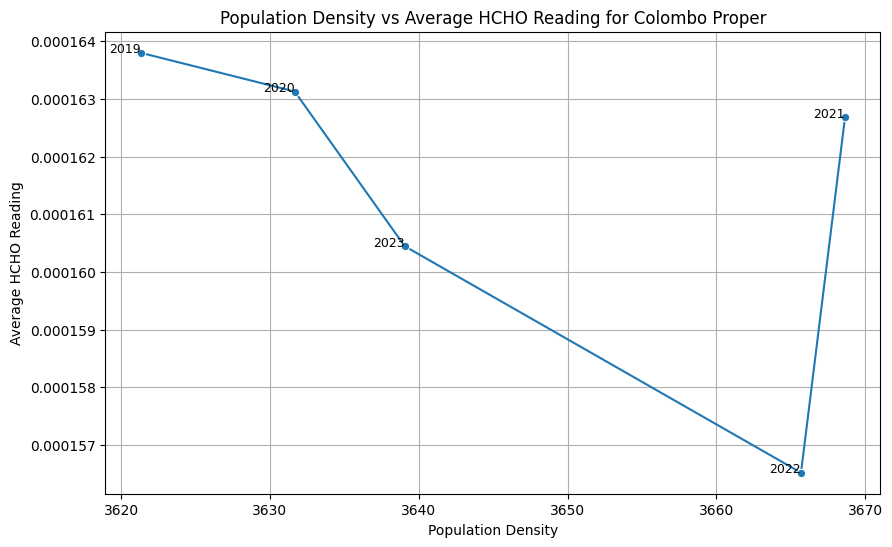

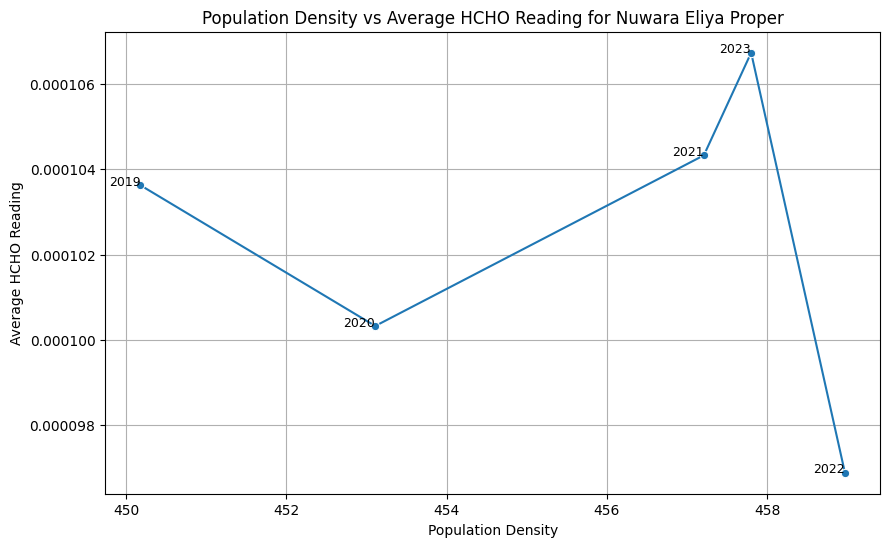

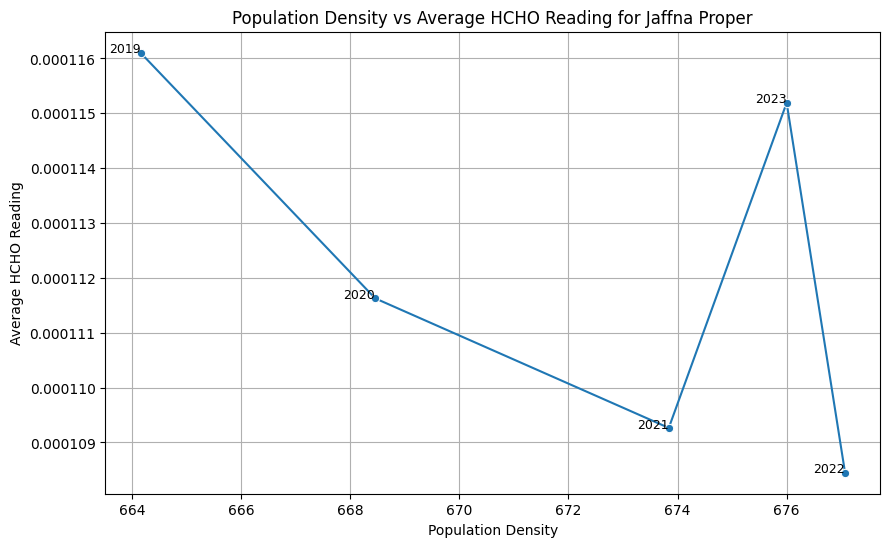

In [48]:
# Draw a line plot which have the population density as the x axis and the average hcho_reading as the y axis for each location
for city in locations:
    city_data = hcho_population_area.filter(hcho_population_area.location == city).toPandas()

    plt.figure(figsize=(10, 6))
    sns.lineplot(x="population_density", y="avg_hcho_reading", data=city_data, marker='o')
    # Add year in each point
    for i in range(len(city_data)):
        plt.text(city_data.population_density[i], city_data.avg_hcho_reading[i], city_data.year[i], fontsize=9, ha='right')
    plt.title(f"Population Density vs Average HCHO Reading for {city}")
    plt.xlabel("Population Density")
    plt.ylabel("Average HCHO Reading")
    plt.grid(True)
    plt.show()


##### Analyzing with elevation of the city

In [52]:
elevation_city = spark.createDataFrame([("Colombo Proper", 1), 
                                        ("Kandy Proper", 500), 
                                        ("Nuwara Eliya Proper", 1868), 
                                        ("Jaffna Proper", 5), 
                                        ("Kurunegala Proper", 120), 
                                        ("Deniyaya, Matara", 3), 
                                        ("Bibile, Monaragala", 151)])

In [53]:
elevation_city = elevation_city.withColumnRenamed("_1", "location").withColumnRenamed("_2", "elevation")

In [54]:
elevation_city.show(truncate=False)

+-------------------+---------+
|location           |elevation|
+-------------------+---------+
|Colombo Proper     |1        |
|Kandy Proper       |500      |
|Nuwara Eliya Proper|1868     |
|Jaffna Proper      |5        |
|Kurunegala Proper  |120      |
|Deniyaya, Matara   |3        |
|Bibile, Monaragala |151      |
+-------------------+---------+



In [55]:
# Join the hcho_population_area and elevation_city dataframes on location
hcho_population_area_elevation = hcho_population_area.join(elevation_city, on="location", how="inner")

In [56]:
hcho_population_area_elevation.show(truncate=False)

+-------------------+----+---------------------+------------------+---------+
|location           |year|avg_hcho_reading     |population_density|elevation|
+-------------------+----+---------------------+------------------+---------+
|Colombo Proper     |2023|1.604477218097932E-4 |3639.05           |1        |
|Colombo Proper     |2022|1.5652069472875345E-4|3665.68           |1        |
|Colombo Proper     |2021|1.626862258493313E-4 |3668.64           |1        |
|Colombo Proper     |2020|1.631286070661978E-4 |3631.66           |1        |
|Colombo Proper     |2019|1.6380077253373357E-4|3621.3            |1        |
|Kandy Proper       |2023|1.161419116449505E-4 |773.08            |500      |
|Kandy Proper       |2022|1.1485841677889332E-4|781.95            |500      |
|Kandy Proper       |2021|1.0575242448038023E-4|782.99            |500      |
|Kandy Proper       |2020|1.1870998135386272E-4|773.6             |500      |
|Kandy Proper       |2019|1.2734102329874902E-4|769.95          

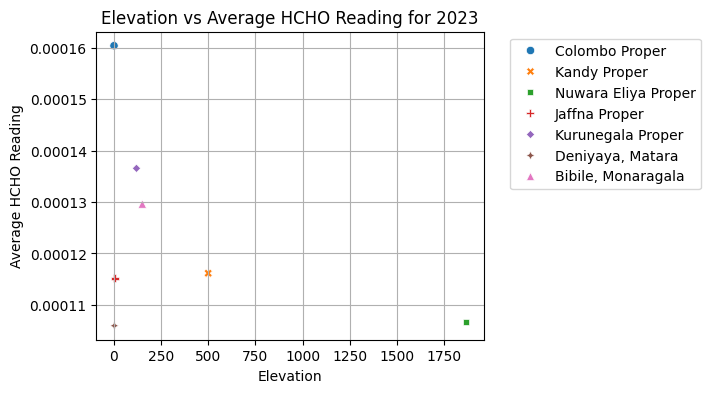

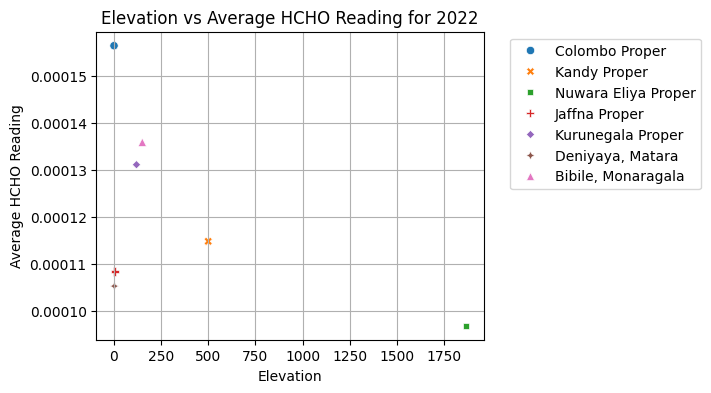

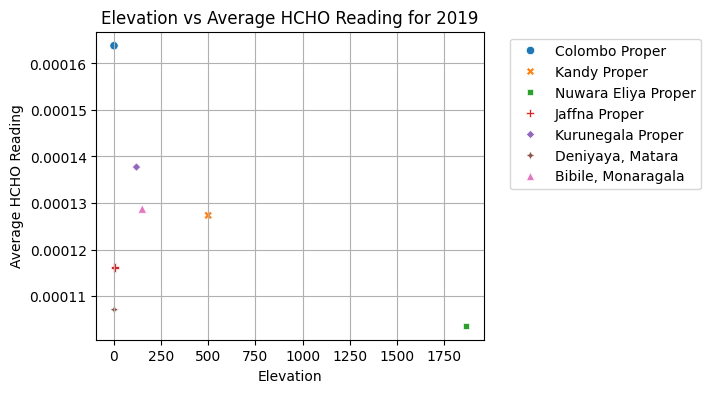

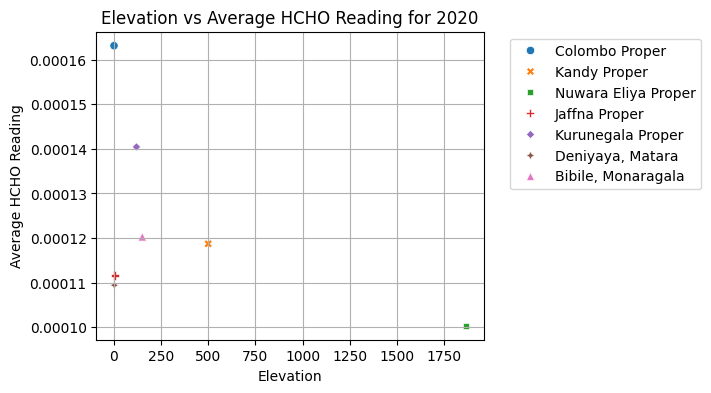

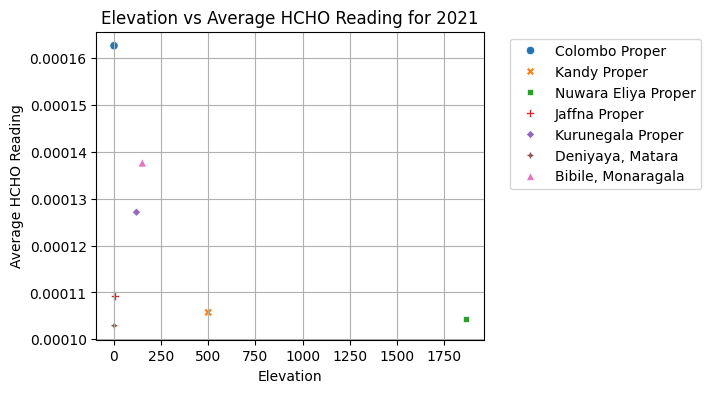

In [63]:
# Draw plot which have the elevation as the x axis and the average hcho_reading as the y axis for each year
years = hcho_population_area_elevation.select("year").distinct().rdd.flatMap(lambda x: x).collect()

for year in years:
    year_data = hcho_population_area_elevation.filter(hcho_population_area_elevation.year == year).toPandas()

    plt.figure(figsize=(5, 4))
    sns.scatterplot(x="elevation", y="avg_hcho_reading", data=year_data, hue="location", style="location")
    plt.title(f"Elevation vs Average HCHO Reading for {year}")
    plt.xlabel("Elevation")
    plt.ylabel("Average HCHO Reading")
    plt.grid(True)
    # Add legend outside the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()